##### ARTI 560 - Computer Vision

## Instance Segmentation - Exercise

### Objective

In this exercise, you will implement **Instance Object Segmentation** using a pretrained **Mask R-CNN model** from TensorFlow Hub.

You will follow these steps:

1. **Load the pretrained Mask R-CNN model**  
   - Use this Kaggle link: [Mask R-CNN Inception-ResNet-v2](https://www.kaggle.com/models/tensorflow/mask-rcnn-inception-resnet-v2)  

2. **Select and load 5 different images**  
   - Choose **5 diverse images**, including:  
      - Crowded scenes with multiple objects  
      - Unusual angles, lighting conditions, or occlusions  
      - At least **one image containing multiple objects of the same class**

3. **Perform inference using the model**  
   - Feed images to the model to obtain predictions  

4. **Extract prediction outputs**  
   - **Bounding boxes** – coordinates of detected objects  
   - **Class labels** – names of detected objects  
   - **Segmentation masks** – pixel-wise masks for each object  

5. **Visualize the results**  
   - Overlay masks on detected objects  
   - Draw bounding boxes around objects  
   - Display class names and confidence scores  

6. **Experiment with confidence thresholds**  
   - Default threshold: **0.5**  
   - Lower threshold: **0.3** to detect more objects (may include false positives)  

---

- Keep in mind:  
  - Some objects may not be recognized at the default threshold
  - The model only detects objects from the **COCO dataset (80 classes)**  


In [ ]:
# Cell 1: Import necessary libraries and load the Mask R-CNN model

import os
import cv2
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt

# Load the pretrained Mask R-CNN model
print("Loading Mask R-CNN model...")
model_url = "https://tfhub.dev/tensorflow/mask_rcnn/inception_resnet_v2_1024x1024/1"
model = hub.load(model_url)
print("Model loaded successfully!")

Loading Mask R-CNN model...
Model loaded successfully!


In [ ]:
#  Download Images Directly to Colab Workspace

import urllib.request
import os

print("Downloading 5 sample images directly to Colab...")

# Dictionary containing filenames and direct official COCO dataset URLs
coco_images = {
    "image1.jpg": "http://images.cocodataset.org/val2017/000000039769.jpg",
    "image2.jpg": "http://images.cocodataset.org/val2017/000000000139.jpg",
    "image3.jpg": "http://images.cocodataset.org/val2017/000000000785.jpg",
    "image4.jpg": "http://images.cocodataset.org/val2017/000000000802.jpg",
    "image5.jpg": "http://images.cocodataset.org/val2017/000000000872.jpg"
}

# Download each image if it doesn't already exist in the workspace
for filename, url in coco_images.items():
    if not os.path.exists(filename):
        urllib.request.urlretrieve(url, filename)
        print(f"Downloaded: {filename}")
    else:
        print(f"Already exists: {filename}")

print("All 5 images are now inside Colab and ready to use!")

Downloaded: image1.jpg
Downloaded: image2.jpg
Downloaded: image3.jpg
Downloaded: image4.jpg
Downloaded: image5.jpg
All 5 images are now inside Colab and ready to use!


In [ ]:
# 2: Define the Inference Function

def perform_inference(image_path, model):
    # 1. Read the image using OpenCV
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Could not load image from {image_path}. Please check the filename.")
        return None

    # 2. Convert the image from BGR to RGB
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # 3. Prepare the image tensor

    input_tensor = tf.convert_to_tensor(img_rgb)
    input_tensor = input_tensor[tf.newaxis, ...]

    # 4. Perform inference

    print(f"Running inference on {image_path}...")
    results = model(input_tensor)

    # 5. Extract and format the required outputs

    result_dict = {
        'original_image': img_rgb,
        'boxes': results['detection_boxes'][0].numpy(),
        'classes': results['detection_classes'][0].numpy().astype(int),
        'scores': results['detection_scores'][0].numpy(),
        'masks': results['detection_masks'][0].numpy()
    }

    return result_dict

print("Inference function 'perform_inference' defined successfully!")

Inference function 'perform_inference' defined successfully!


In [ ]:
#  3: Define the Visualization Function and COCO Labels

import numpy as np
import cv2
import matplotlib.pyplot as plt

# 1. Define COCO classes mapping (IDs to string labels)
COCO_CLASSES = {
    1: 'person', 2: 'bicycle', 3: 'car', 4: 'motorcycle', 5: 'airplane',
    6: 'bus', 7: 'train', 8: 'truck', 9: 'boat', 10: 'traffic light',
    11: 'fire hydrant', 13: 'stop sign', 14: 'parking meter', 15: 'bench',
    16: 'bird', 17: 'cat', 18: 'dog', 19: 'horse', 20: 'sheep', 21: 'cow',
    22: 'elephant', 23: 'bear', 24: 'zebra', 25: 'giraffe', 27: 'backpack',
    28: 'umbrella', 31: 'handbag', 32: 'tie', 33: 'suitcase', 34: 'frisbee',
    35: 'skis', 36: 'snowboard', 37: 'sports ball', 38: 'kite', 39: 'baseball bat',
    40: 'baseball glove', 41: 'skateboard', 42: 'surfboard', 43: 'tennis racket',
    44: 'bottle', 46: 'wine glass', 47: 'cup', 48: 'fork', 49: 'knife', 50: 'spoon',
    51: 'bowl', 52: 'banana', 53: 'apple', 54: 'sandwich', 55: 'orange',
    56: 'broccoli', 57: 'carrot', 58: 'hot dog', 59: 'pizza', 60: 'donut',
    61: 'cake', 62: 'chair', 63: 'couch', 64: 'potted plant', 65: 'bed',
    67: 'dining table', 70: 'toilet', 72: 'tv', 73: 'laptop', 74: 'mouse',
    75: 'remote', 76: 'keyboard', 77: 'cell phone', 78: 'microwave', 79: 'oven',
    80: 'toaster', 81: 'sink', 82: 'refrigerator', 84: 'book', 85: 'clock',
    86: 'vase', 87: 'scissors', 88: 'teddy bear', 89: 'hair drier', 90: 'toothbrush'
}

def visualize_results(result_dict, min_score_thresh=0.5):
    # 2. Extract data from the results dictionary
    img = result_dict['original_image'].copy()
    boxes = result_dict['boxes']
    classes = result_dict['classes']
    scores = result_dict['scores']
    masks = result_dict['masks']

    height, width, _ = img.shape

    # 3. Loop through all detected objects
    for i in range(len(scores)):
        # Filter out weak predictions based on the given threshold
        if scores[i] >= min_score_thresh:

            # Extract box coordinates and scale them to image size
            ymin, xmin, ymax, xmax = boxes[i]
            y1, x1 = max(0, int(ymin * height)), max(0, int(xmin * width))
            y2, x2 = min(height, int(ymax * height)), min(width, int(xmax * width))

            box_width = x2 - x1
            box_height = y2 - y1

            if box_width <= 0 or box_height <= 0:
                continue

            # Generate a random color for this object
            color = [int(c) for c in np.random.randint(0, 255, size=3)]

            # 4. Draw the bounding box
            cv2.rectangle(img, (x1, y1), (x2, y2), color, 3)

            # 5. Process and overlay the segmentation mask
            mask = masks[i]
            scaled_mask = cv2.resize(mask, (box_width, box_height))
            # Convert mask probabilities to binary (0 or 1)
            binary_mask = (scaled_mask > 0.5).astype(np.uint8)

            # Create a colored patch for the mask area
            colored_mask = np.zeros((box_height, box_width, 3), dtype=np.uint8)
            colored_mask[binary_mask == 1] = color

            # Blend the mask with the original image region
            roi = img[y1:y2, x1:x2]
            blended = cv2.addWeighted(roi, 0.6, colored_mask, 0.4, 0)

            # Apply the blended pixels back to the image only where the mask is active
            mask_indices = binary_mask == 1
            roi[mask_indices] = blended[mask_indices]
            img[y1:y2, x1:x2] = roi

            # 6. Add the class label and confidence score
            class_id = classes[i]
            label_name = COCO_CLASSES.get(class_id, f'Unknown_{class_id}')
            display_str = f"{label_name}: {int(scores[i]*100)}%"

            # Adjust text position to ensure it is visible
            text_y = y1 - 10 if y1 - 10 > 10 else y1 + 20
            cv2.putText(img, display_str, (x1, text_y), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

    # 7. Display the final image using Matplotlib
    plt.figure(figsize=(12, 12))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Threshold: {min_score_thresh}")
    plt.show()

print("Visualization function 'visualize_results' defined successfully!")

Visualization function 'visualize_results' defined successfully!



--- Processing image1.jpg ---
Running inference on image1.jpg...
Visualizing results for image1.jpg with threshold 0.5...


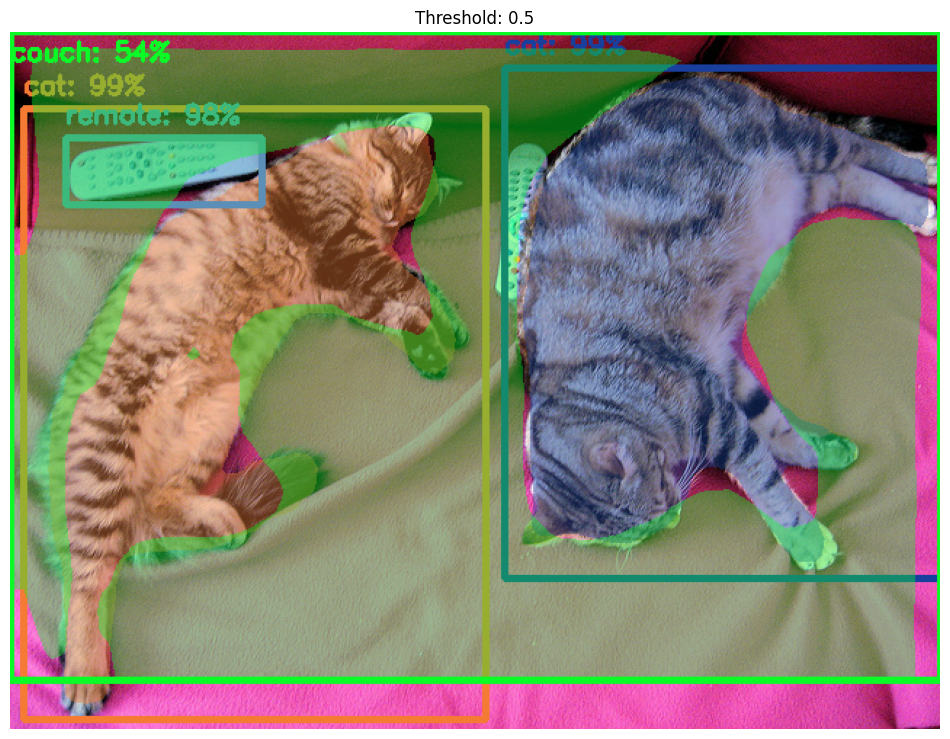


--- Processing image2.jpg ---
Running inference on image2.jpg...
Visualizing results for image2.jpg with threshold 0.5...


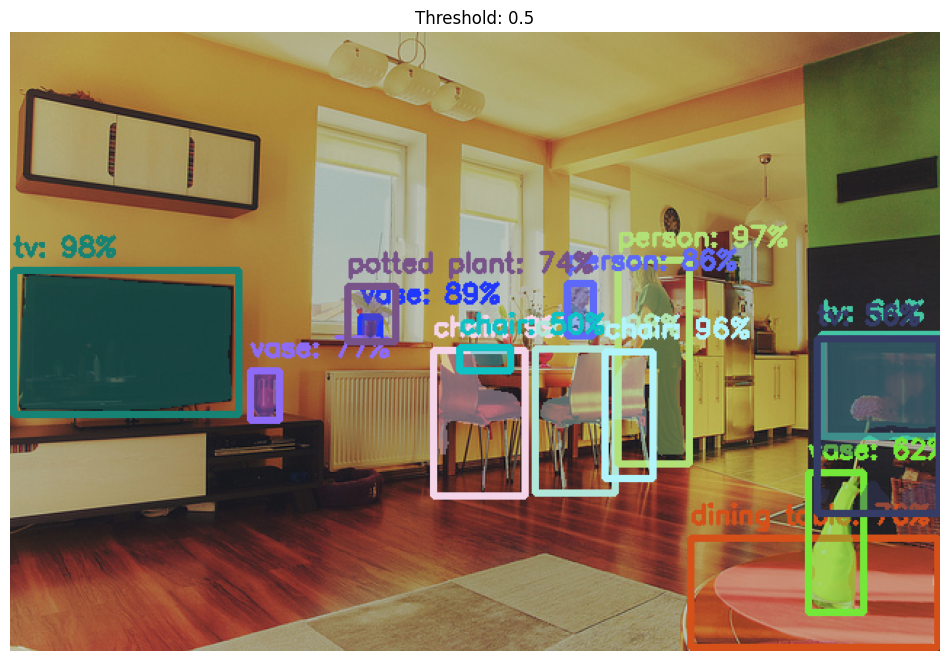


--- Processing image3.jpg ---
Running inference on image3.jpg...
Visualizing results for image3.jpg with threshold 0.5...


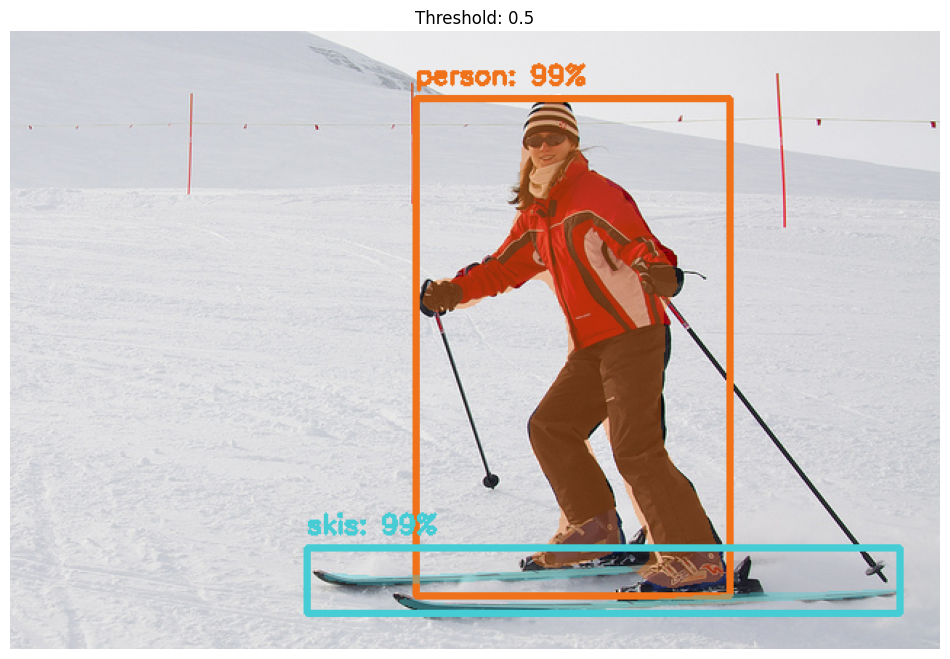


--- Processing image4.jpg ---
Running inference on image4.jpg...
Visualizing results for image4.jpg with threshold 0.5...


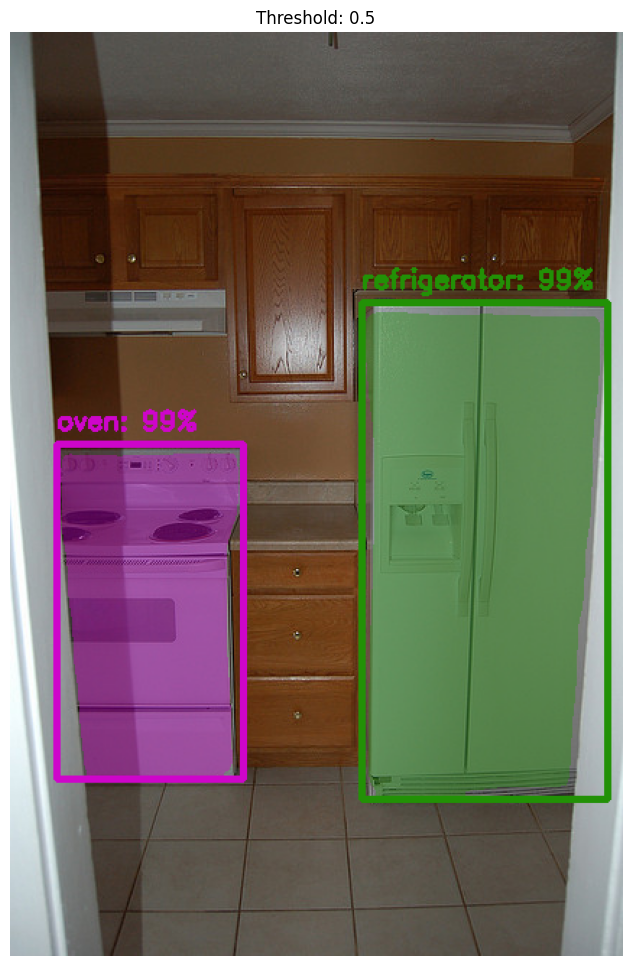


--- Processing image5.jpg ---
Running inference on image5.jpg...
Visualizing results for image5.jpg with threshold 0.5...


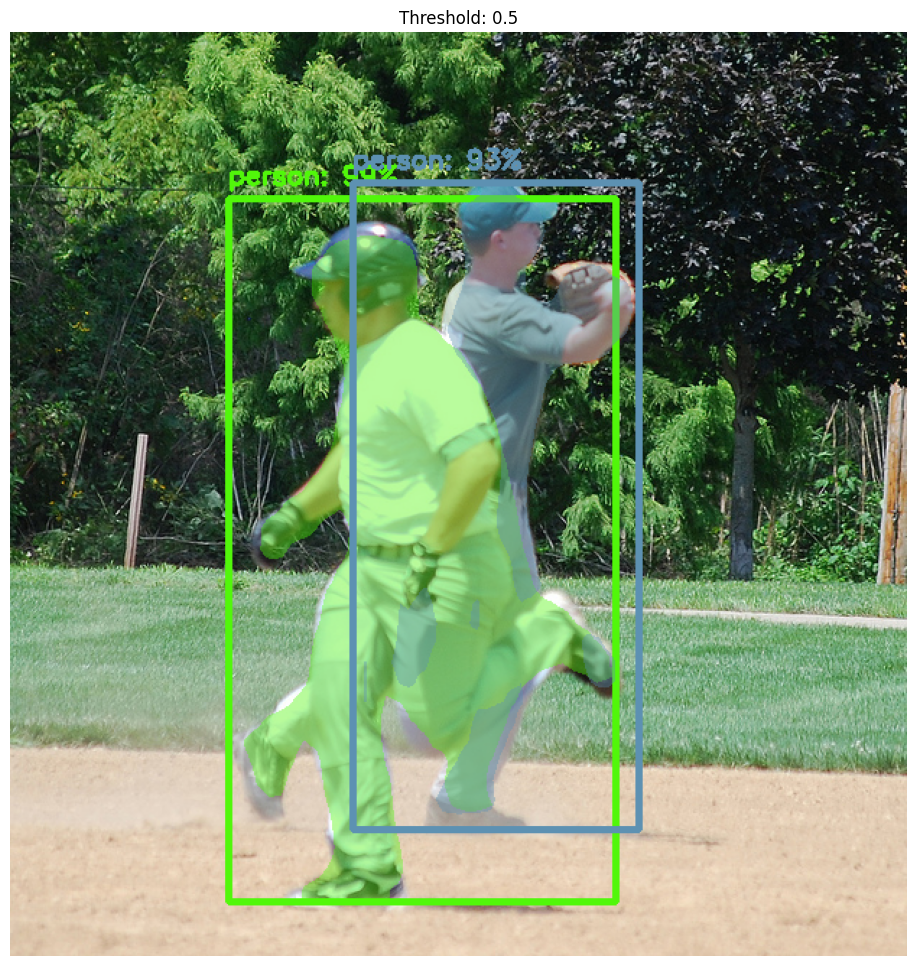


Finished processing all images with the default threshold.


In [ ]:
# 4: Run Inference and Visualize Results (Default Threshold: 0.5)

import os

# 1. Define the list of image filenames
image_filenames = ["image1.jpg", "image2.jpg", "image3.jpg", "image4.jpg", "image5.jpg"]

# 2. Set the confidence threshold
default_threshold = 0.5

# 3. Loop through each image and process it
for filename in image_filenames:
    print(f"\n--- Processing {filename} ---")

    # Check if the file exists before processing
    if not os.path.exists(filename):
        print(f"Error: File {filename} not found in the current directory.")
        continue

    # Perform inference using the function from Cell 2
    results = perform_inference(filename, model)

    # If inference is successful, visualize the results
    if results is not None:
        print(f"Visualizing results for {filename} with threshold {default_threshold}...")
        visualize_results(results, min_score_thresh=default_threshold)

print("\nFinished processing all images with the default threshold.")

Starting inference with a lower threshold of 0.3...

--- Processing image1.jpg ---
Running inference on image1.jpg...
Visualizing results for image1.jpg with threshold 0.3...


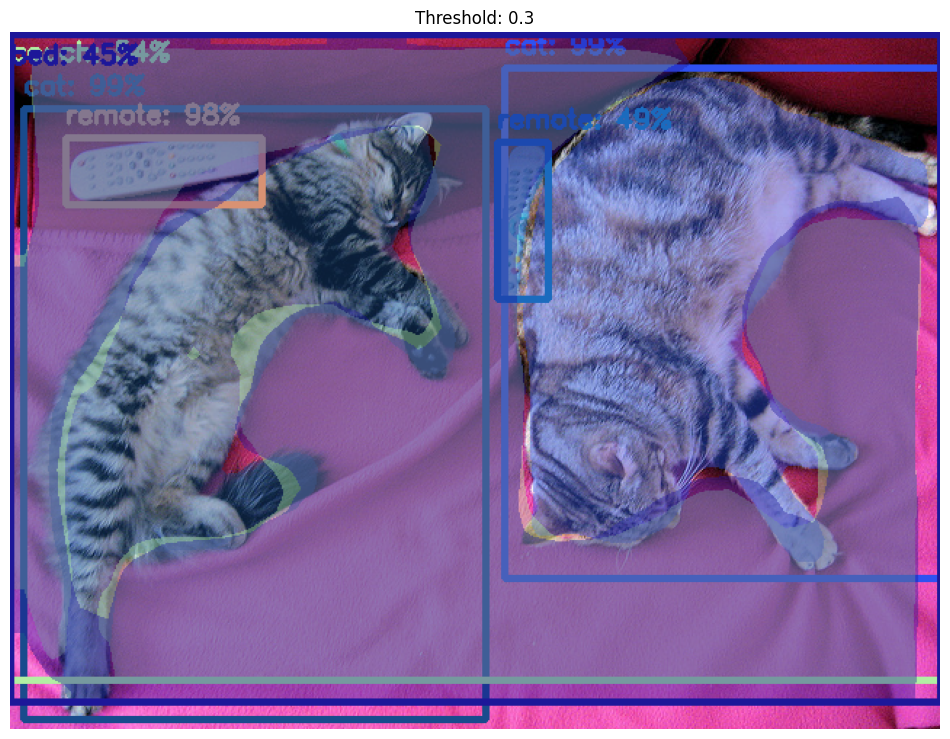

--- Processing image2.jpg ---
Running inference on image2.jpg...
Visualizing results for image2.jpg with threshold 0.3...


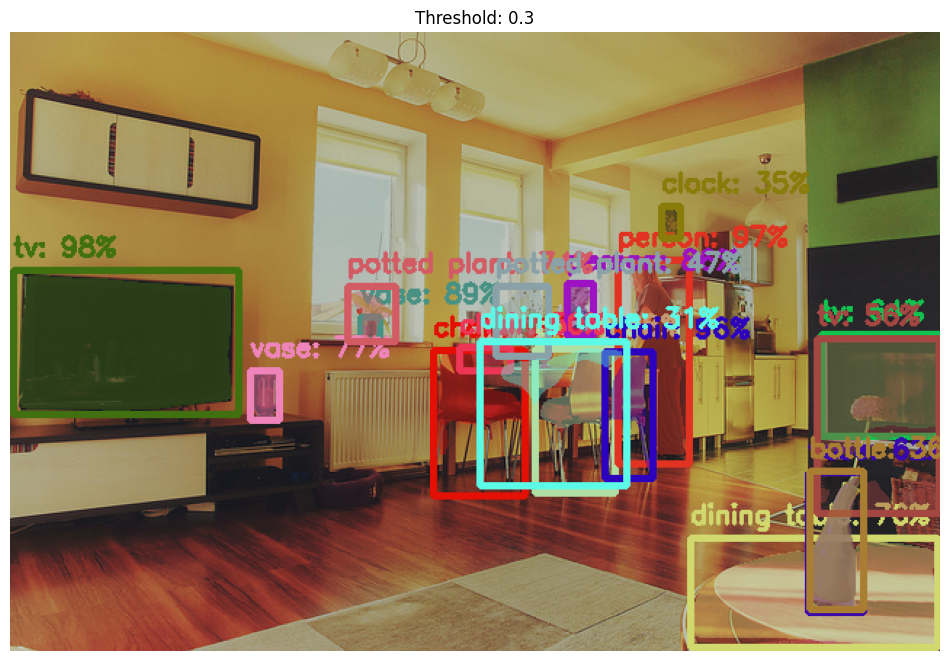

--- Processing image3.jpg ---
Running inference on image3.jpg...
Visualizing results for image3.jpg with threshold 0.3...


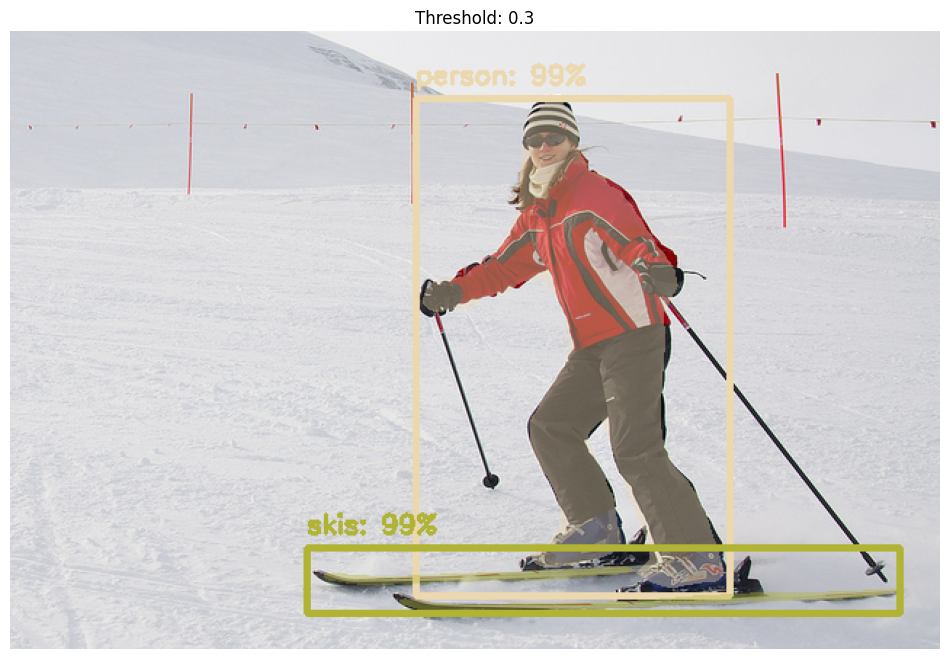

--- Processing image4.jpg ---
Running inference on image4.jpg...
Visualizing results for image4.jpg with threshold 0.3...


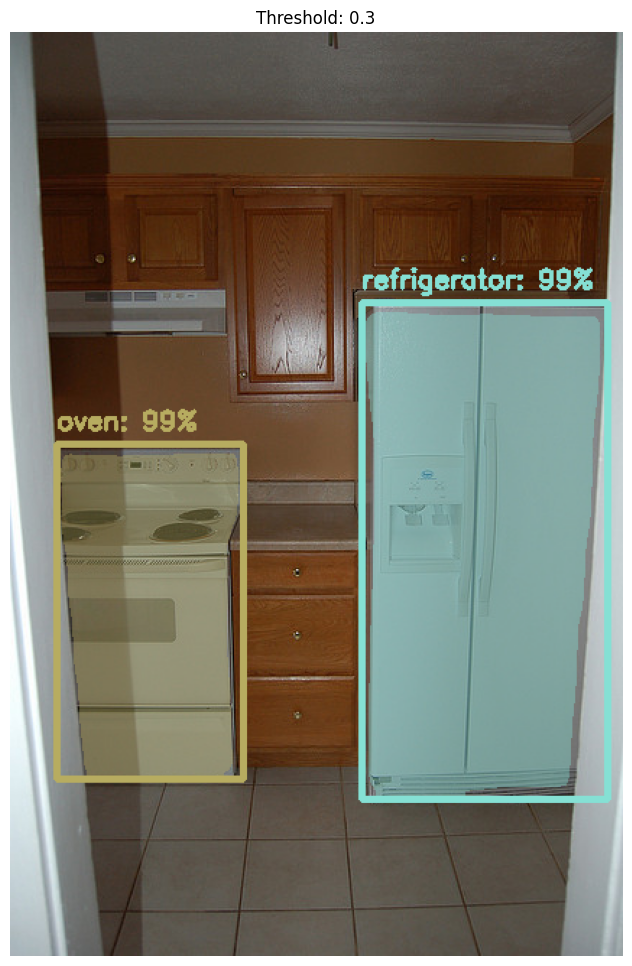

--- Processing image5.jpg ---
Running inference on image5.jpg...
Visualizing results for image5.jpg with threshold 0.3...


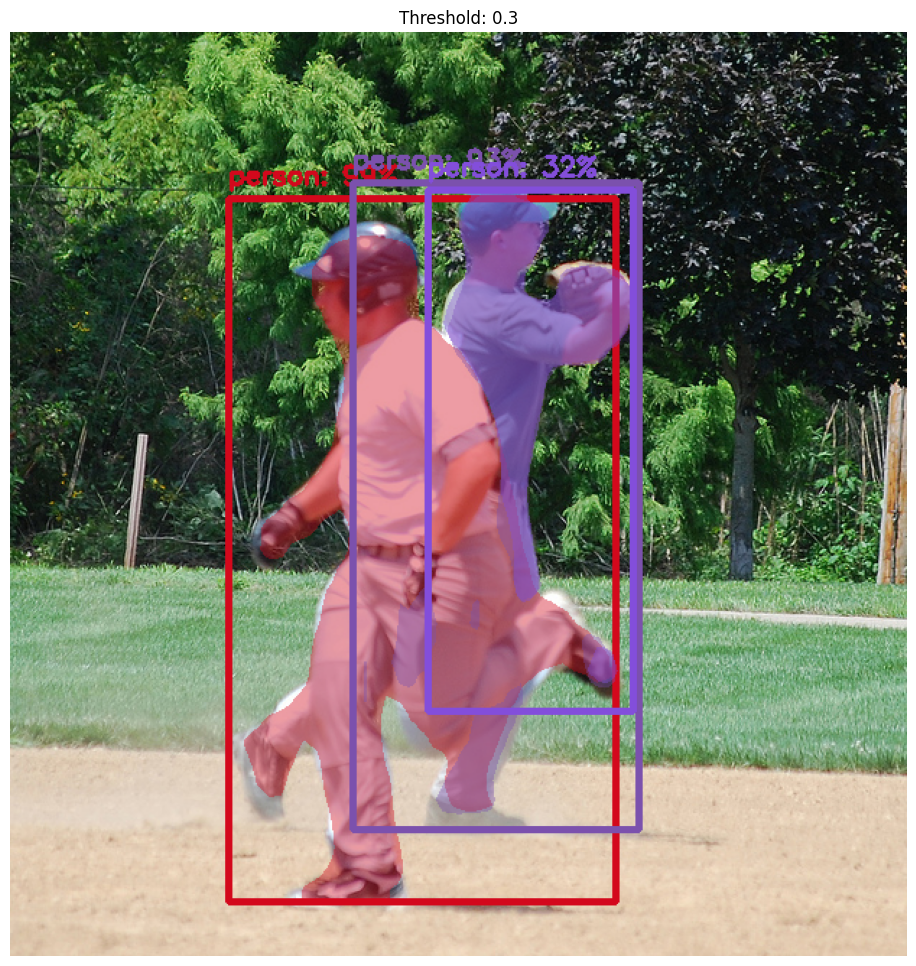


Finished processing all images with the lower threshold. 


In [ ]:
# 5: Run Inference and Visualize Results (Lower Threshold: 0.3)

import os

# 1. Define the list of image filenames
image_filenames = ["image1.jpg", "image2.jpg", "image3.jpg", "image4.jpg", "image5.jpg"]

# 2. Set the lower confidence threshold
lower_threshold = 0.3

print(f"Starting inference with a lower threshold of {lower_threshold}...\n")

# 3. Loop through each image and process it
for filename in image_filenames:
    print(f"--- Processing {filename} ---")

    # Check if the file exists
    if not os.path.exists(filename):
        print(f"Error: File {filename} not found.")
        continue

    # Perform inference using the existing function
    results = perform_inference(filename, model)

    # Visualize the results using the new lower threshold
    if results is not None:
        print(f"Visualizing results for {filename} with threshold {lower_threshold}...")
        visualize_results(results, min_score_thresh=lower_threshold)

print("\nFinished processing all images with the lower threshold. ")